# Demo : ASP deconvolver implementation in CASA

This simulation and imaging demo illustrates the numerical and functional performance of the ASP deconvolution algorithm as implemented within CASA (currently as an experimental algorithm). 

The Asp algorithm has been implemented as a minor-cycle option within the tclean task. It defines the sky model as a collection of Gaussians whose parameters are optimized as part of an iterative process. The [current CASA implementation](https://open-jira.nrao.edu/secure/attachment/24783/24783_ardg_aspclean.pdf) is an adaptation of the original [Asp deconvolution algorithm](https://arxiv.org/abs/astro-ph/0407225) in which each iteration optimizes/adjusts the parameters of one Gaussian and includes it in the global list of best-fit Gaussians. The algorithm begins with an automatically-generated initial guess of four scales of sizes ranging from two to eight times the PSF width, and this list is then allowed to evolve and grow. Two control parameters are offered. One is to limit the largest scale allowed for the initial guess, meant to stabilize the reconstruction for under-constrained situations. The second is a threshold to signal a switch from the Asp iterations to a point-source-only deconvolution for the rest of the deconvolution, meant to improve speed at a stage where Gaussian fits are no longer beneficial and a point-source model will suffice.

A test dataset was constructed with characteristics that are sometimes a challenge for CLEAN-based algorithms, but for which the ASP algorithm is expected to be more robust towards. The Hogbom, Multiscale and Asp algorithms were run, and metrics evaluated against a known true sky model. The control parameters of the Asp implementation were also exercised in order to ascertain whether they resulted in the expected changes in convergence behaviour. 

Below is a summary. Please navigate using the links below to see details and plots. The "Comparison Results" links below contain the most concise information. 

[__Simulating the dataset__](#ConstructData)

* [__Observation Setup__](#ObsSetup) : VLA D-config at 1-2GHz with 5 channels and integrations spanning -5h to +55h Hourangle. Noise has been added.

* [__Sky Model__](#SkyModel) : A core-jet structure with spatial scales ranging from a point source to extended emission matched to the size of the uv-hole, and smooth continuum spectral structure ranging from a spectral index of 0.0 at the core, to about -1.0 in the extended lobe structure. A point source is also located atop the extended emission to simulate what is usually a difficult imaging case. 
    
    
[__Metrics__](#Metrics)

Numerical metrics include residual RMS, Chi-square and image-fidelity applied (as appropriate) to the residual image, restored image, and fitted spectral index image, and compared with a known truth image. Operational metrics include total runtime, the number of iterations done, and the number of major cycles triggered. All image cubes (including the truth model image used for the simulations) are smoothed to the same target resultion before comparison.  

    
[__Test Hogbom/Multiscale/Asp with masks__](#CompareWithMasks)

* [Comparison of Results](#CompareResults1) : All algorithms were run with a simple round mask, and an nsigma threshold-based exit criterion. In addition, a second Hogbom run was done with automasking turned on, to emulate the ALMA pipeline use case. 
    * All numerical metrics clearly show improved behaviour from Hogbom to MSClean to Asp, along with faster convergence, the need for fewer iterations, and better tolerance to a large loop gain. For the Asp algorithm, a high loop gain is recommended because of the increased accuracy per iteration, and for this dataset, this was effective at reducing the number of iterations needed, without sacrificing numerical quality. 
    * Asp had a significantly larger total runtime than the other algorithms, even given the dramatically-reduced number of iterations it needed to reach the same stopping threshold. 
    * The use of automasking with Hogbom resulted in higher residuals, but it improved image fidelity and got it closer to that measured for MSClean and Asp (which were run with just round masks). The total runtime was still small compared to Asp, but more than MSClean. 
    
[__Test Hogbom/Multiscale/Asp with no masks__](#CompareNoMasks)

* [Comparison of Results](#CompareResults2) : This tests the robustness of the algorithms to a poorly-constrained system of equations. In this example, all algorithms exhibit undesirable behavior without the round mask. The Asp algorithm showed instabilities at loop gains of 0.4 or more, with considerably longer runtimes for lower loop gain values. 
    
[__Tuning the Asp deconvolver__](#TuneAsp)
* [Comparison of Results](#CompareResults3) : Test/illustrate the effect of each of its key parameters.  
    * Default values : The initial guess for scale sizes included ones that were large for this dataset, resulting in poor behavior. MSClean also exhibited a similar instability if those same scale sizes were provided to it. (Note : Other simulated and real datasets did not exhibit this instability.)
    * 'largestscale' : The deconvolution stabilized easily by limiting the largest scale allowed for the initial guess of internal scale sizes. (_Tip_: Use the information in the logger about fitted scale sizes to ascertain what scales were actually fitted.)
    * 'gain' : A high loop gain was able to effectively take advantage of the more-accurate fits per iteration, reaching convergence threshold a far fewer iterations than Hogbom or MultiScale, and with superior numerical quality. 
    * 'fusedthreshold' : A way to switch to a point-source clean below a certain threshold when the flux in the residual image is no longer well-represented by Gaussians. This option was able to reduce the total runtime with only a very minor accuracy penalty.
     
[__Future Work/Tests__](#Future) : Additional topics/features to add/test.

_Note : These results are based on one simulated dataset and so generalization of the results must be done with appropriate caution._
***

# Simulating the dataset <a class="anchor" id="ConstructData"></a>

## Observation setup <a class="anchor" id="ObsSetup"></a>

 - Config : VLA D-Config
 - Bandwidth : 1-2 GHz, with 5 channels within this range. 
 - Range of spatial scales meaasured (max=1km, min=0.1km): 
     - At 1 GHz : 1.0 arcmin -> 10.3 arcmin 
     - At 2 GHz : 0.5 arcmin -> 5.2 arcmin 
 - Measurements were simulated 30min apart for a time range of -5h to +5h in HourAngle. 

In [1]:
%run -i Sim_Multiscale_Wideband_Script.py
%run -i Display_Experiments_Script.py
#%matplotlib widget
#%matplotlib inline

In [2]:
makeMSFrame(msn='sim_data', tel='VLA')

Making an MS named : sim_data_VLA.ms


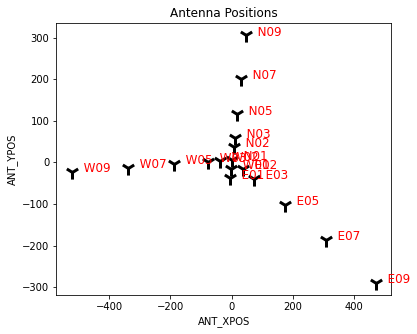

In [3]:
XPlot(vis='sim_data_VLA.ms', ptype='plotants')#,forceconvert=True)

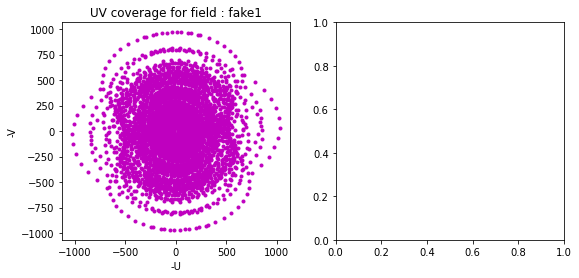

In [4]:
XPlot(vis='sim_data_VLA.ms', ptype='uvcov')

In [5]:
listobs_jupyter(vis='sim_data_VLA.ms')

           MeasurementSet Name:  /export/home/riya/rurvashi/Work/SimScripts/Simulation-in-CASA/Multiscale_Wideband_Imaging/sim_data_VLA.ms      MS Version 2
   Observer: CASA simulator     Project: CASA simulation  
Observation: VLA(18 antennas)
Data records: 2754       Total elapsed time = 36000 seconds
   Observed from   03-Oct-2020/21:18:42.9   to   04-Oct-2020/07:18:42.9 (UTC)

Fields: 1
  ID   Code Name                RA               Decl           Epoch   SrcId      nRows
  0         fake1               19:59:28.500000 +40.40.00.00000 J2000   0           2754
Spectral Windows:  (1 unique spectral windows and 1 unique polarization setups)
  SpwID  Name   #Chans   Frame   Ch0(MHz)  ChanWid(kHz)  TotBW(kHz) CtrFreq(MHz)  Corrs  
  0      LBand      5   TOPO    1000.000    200000.000   1000000.0   1400.0000   RR  LL
Antennas: 18 'name'='station' 
   ID=   0-5: 'W01'='P', 'W02'='P', 'W03'='P', 'W05'='P', 'W07'='P', 'W09'='P', 
   ID=  6-11: 'E01'='P', 'E02'='P', 'E03'='P', 'E05'='P',

## Sky model <a class="anchor" id="SkyModel"></a>

#### Source structure - "jet"
 - A simulation of a core-jet like structure with spatial scales ranging from a point source to 7.0 arcmin, and spectral index ranging from 0.0 at the core to -0.8 in the lobe, with a -1.0 spectral index point source embedded in the extended structure of the lobe. 
 - The spatial structure was constructed as a sum of symmetric Gaussians with different spectral indices, to form a smoothly varying set of features. The resulting spectrum will not be a pure power law. 
 - The core is a point source spatially separated from the jet and serves as a control. A second point source was added atop the extended emission to bring in a typical challenging situation for CLEAN-based greedy algorithms.   
 - Spatial structure ranging up to 7.0arcmin in the simulated sky brightness distribution  partial constraints from the measured data, and an accurate reconstruction depends on the algorithm's ability to apply realistic and valid biases. 
 - The spectral index in the lobe was chosen to have a steep spectrum in the outer regions of the source where the flux density is low in comparison to the more compact structure. This represents a situation often seen and where current approaches are unable to reliably reconstruct the spectrum (either by fitting spectra to a cube image or with the mtmfs algorithm). 


#### Other 
Two other spatial structures are available for these tests (in the supporting script). Note that the round mask size may need to be edited for these other examples.

__Source structure - "basic"__
Three well-separated sources, two of which a point sources and one a 7arcmin Gaussian. This test the two extremes of angular resolutions.

__Source structure - "simple"__ 
Two control point sources and a pair of blended Gaussians, each 5arcmin in size and with opposite spectral indices. This example is more relevent for a wideband reconstruction than a cube imaging exercise because it contains a turnover spectrum in the overlap region of the two Gaussians. 
 

In [6]:
#source = 'basic'
#source = 'simple'
source = 'jet'

In [7]:
%run -i Sim_Multiscale_Wideband_Script.py
%run -i Display_Experiments_Script.py

In [8]:
## Make the component list
makeCompList(clname_true='sim_'+source+'_vla.cl',tel='VLA',stype=source)
## Make an empty CASA image
makeEmptyImage(imname_true='sim_'+source+'_vla.im',tel='VLA')
## Evaluate the component list onto the CASA image
evalCompList(clname='sim_'+source+'_vla.cl', imname='sim_'+source+'_vla.im')

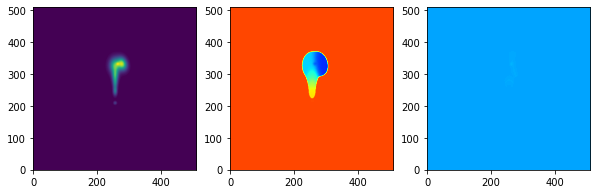

In [9]:
## Smooth to an angular resolution of 100 arcsec. 
## This matches the Cube lowest resolution (first channel) 
#smoothModel(imname='sim_'+source+'_vla.im',rbeam='100arcsec')
imsmooth(imagename='sim_'+source+'_vla.im',
            outfile='sim_'+source+'.cube',
            major='100.0arcsec',minor='100.0arcsec',pa='0.0deg',
            targetres=True,overwrite=True)

fit_spectrum(cubename='sim_'+source+'.cube',
             intensity='sim_'+source+'.cont',
             alpha='sim_'+source+'.alpha',
             beta='sim_'+source+'.beta',
             pixt=0.1)

These average intensity, spectral index and curvature maps are to be used as a reference, to evaluate the quality of Cube (spectral line) imaging of the ASP (and MSClean and Hogbom) algorithms. They represent the best-case scenario of being able to reconstruct spectral index and curvature just from Cube imaging (and without MTMFS). 

They also represent a low-resolution version of what ought to be deliverable from the current MTMFS implementation and the future Wideband ASP algorithm. 


## Simulate visibilities from the sky model

Simulate visibilities for the true sky model, using the standard gridder (no primary beams)

In [10]:
%run -i Sim_Multiscale_Wideband_Script.py
%run -i Display_Experiments_Script.py


In [11]:
predictImager(msname='sim_data_VLA.ms',
              imname_true='sim_'+source+'_vla.im', 
              tel='VLA',
              gridder='standard')
copyModelToData(msname='sim_data_VLA.ms')

['fake1']


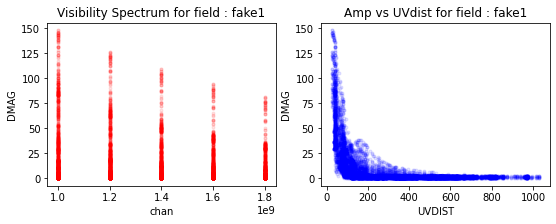

In [12]:
XPlot(vis='sim_data_VLA.ms', ptype='amp-freq-uvdist') #,forceconvert=True)

In [13]:
### Add noise.... later
addNoiseSim(msname='sim_data_VLA.ms',noise=1.0)

# Metrics <a class="anchor" id="Metrics"></a>

The following metrics were evaluated and then visualized to test several expectations about the behaviour of the Asp algorithm. 

Let the a smoothed true image be $M$, output restored image be $I$, and output residual image be $R$

#### Residual RMS
The RMS of the residual image pixel values : $rms(R)$
 
#### Chi-Square
A goodness-of-fit metric evaluated against the smoothed true image :   $\sqrt{\frac{\sum_{i=1}^{N} |I_i - M_i|^2}{N}}$ .<br>
This metric is sensitive to differences across the entire image, giving equal weight to all pixels. A perfect fit will yield a value that matches the image rms noise level. We set $W=1$ over the entire flux density image.
 
#### Image Fidelity 
An image fidelity metric defined as $1 - \frac{ \sum_{i=1}^{N} B_i W_i |M_i - I_i|}{\sum_{i=1}^N B_i W_i}$ <br>
where $W$ is a window function to select pixels of interest (e.g. PB cutoff mask), and $B$ is a pixel weight calculated as $B_i = max(|I_i|, |M_i|)$. The weight image $B$ emphasizes differences from the truth image for on-source pixels as well as away from the source. Such a weighted average of the absolute difference between the truth and output images is sensitive to off-source imaging artifacts. We set $W=1$ over the entire flux density image. (This is a modified version of eqn 10 from ngVLA memo 67). 

#### Spectral index accuracy
The above metrics of chi-square and image fidelity are computed for the fitted spectral index from the output cube, using a window $W$ that encompasses only on-source pixels for which the spectral fit was itself successful. 
With complex extended emission, a dominant source of error in spectral index fits on cubes is the deconvolution inaccuracy per channel. These metrics assess the consistency of the reconstructions across spectral channels and its effect on a spectral index fit.

#### Convergence profile
We record convergence history of the peak residual and total model flux per channel, as well as the total number of iterations done, the number of major cycles triggered, and the total runtime. The metrics provide a way to analyse the speed of convergence (numerical accuracy of each step) and associated compute cost. 

     

# Compare Hogbom, Multiscale, Asp (with masks) <a class="anchor" id="CompareWithMasks"></a>

For each cube imaging run, we display the reconstructed and residual images, convergence plots (per channel), the spectral index that may be fit from the output cube, and the relative difference between the smoothed true sky model and the reconstruction (normalized by the peak of the smoothed true image). 


In [63]:
## A flag to run the notebook without re-running the imaging, but to only recompute metrics
run_imaging=False

## Hogbom Cube (round mask)

In [94]:
%run -i Sim_Multiscale_Wideband_Script.py
%run -i Display_Experiments_Script.py

all_results={}

In [95]:
if run_imaging==True:
    imname='try_cube_hogbom'
    os.system('rm -rf '+imname+'.*')
    casalog.setlogfile(imname+'.log')

    st = time.time()
    rec = tclean(vis='sim_data_VLA.ms',imagename=imname,imsize=512,cell='12.0arcsec',
           specmode='cube',interpolation='nearest',nchan=5,start='1.0GHz',width='0.2GHz',
           pblimit=-1e-05,deconvolver='hogbom',niter=100000, gain=0.2, threshold='0.05Jy',nsigma=1.5,
            interactive=0,mask='circle[[256pix,290pix],140pix]')
    et = time.time()
    rec['runtime']=et-st
    np.save(imname+'.summary.npy', rec) 

### Hogbom will produce better results if allowed to clean 'deeper' but then it will clean into
### the noise all around the source too. It needs automasking to reach on-source thresholds that
### ms-clean and asp achieve with out the auto-mask. 


-----------------------------------------------------------------------
Restored and Residual Images and RMS
-----------------------------------------------------------------------
Channels from try_cube_hogbom.image


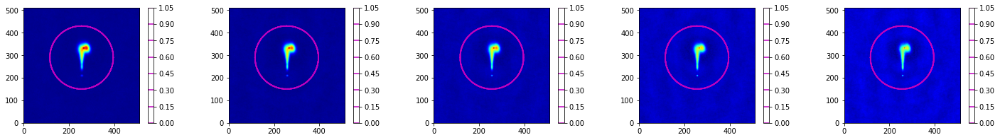

Channels from try_cube_hogbom.residual


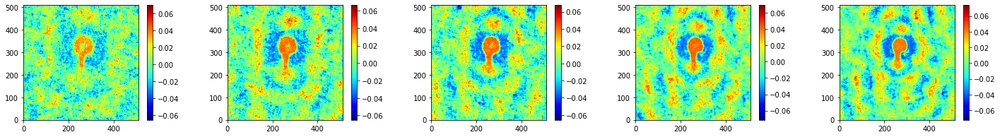

RMS spectrum : [0.01797384 0.01804161 0.01857403 0.01918806 0.01972289]

-----------------------------------------------------------------------
Chisq and Image Fidelity
-----------------------------------------------------------------------
(Truth - Output)/max(Truth_0)


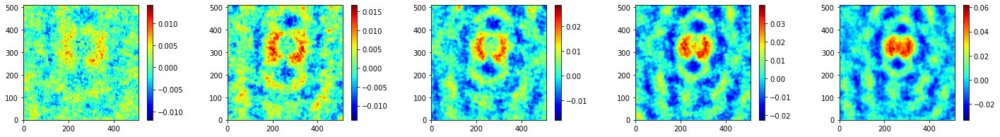

Chi-Square : 0.018	0.028	0.041	0.059	0.084	
Image Fidelity : 0.984	0.979	0.955	0.909	0.845	

----------------------------------------------------------------------
Fitted continuum intensity, spectral index and curvature
----------------------------------------------------------------------


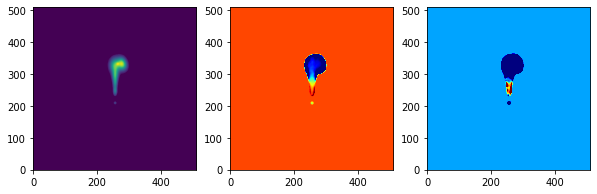

(Truth - Output)


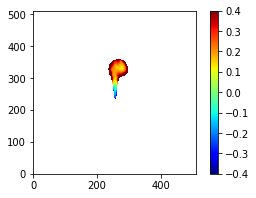

Chi-Square : 0.777	
Image Fidelity : 0.712	

----------------------------------------------------------------------
Convergence Plots : Peak Residual and Model Flux
----------------------------------------------------------------------
Total Runtime : 15.66


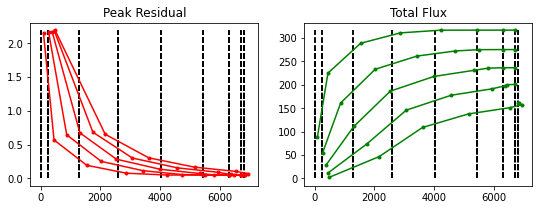

In [96]:
%run -i Sim_Multiscale_Wideband_Script.py
%run -i Display_Experiments_Script.py

all_results['try_cube_hogbom'] = inspectResults(imagename='try_cube_hogbom',truthname='sim_'+source,maskthreshold=0.5)

## Multiscale Cube (round mask)

In [97]:
if run_imaging==True:
    imname='try_cube_multiscale'
    os.system('rm -rf '+imname+'.*')
    casalog.setlogfile(imname+'.log')
    
    st = time.time()
    rec = tclean(vis='sim_data_VLA.ms',imagename=imname,imsize=512,cell='12.0arcsec',
           specmode='cube',interpolation='nearest',nchan=5,start='1.0GHz',width='0.2GHz',
           pblimit=-1e-05,deconvolver='multiscale',niter=20000,gain=0.2,  threshold='0.05Jy',nsigma=1.5,
                 scales=[0,3,10,20],interactive=0,mask='circle[[256pix,290pix],140pix]')
    et = time.time()
    rec['runtime']=et-st
    np.save(imname+'.summary.npy', rec) 


-----------------------------------------------------------------------
Restored and Residual Images and RMS
-----------------------------------------------------------------------
Channels from try_cube_multiscale.image


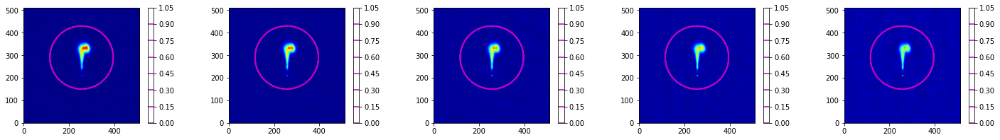

Channels from try_cube_multiscale.residual


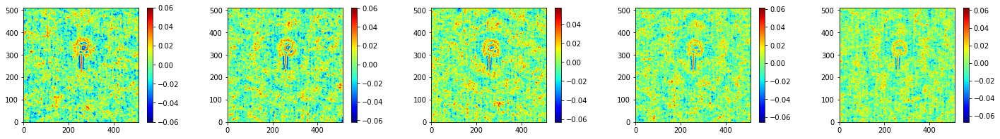

RMS spectrum : [0.01480501 0.01496455 0.01489488 0.01491311 0.01499558]

-----------------------------------------------------------------------
Chisq and Image Fidelity
-----------------------------------------------------------------------
(Truth - Output)/max(Truth_0)


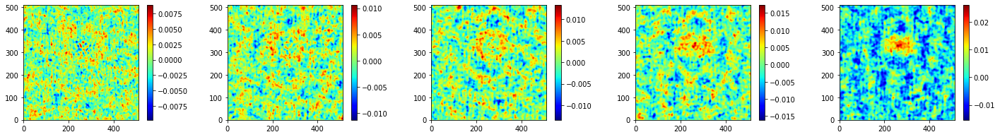

Chi-Square : 0.015	0.019	0.023	0.029	0.037	
Image Fidelity : 0.982	0.982	0.979	0.961	0.933	

----------------------------------------------------------------------
Fitted continuum intensity, spectral index and curvature
----------------------------------------------------------------------


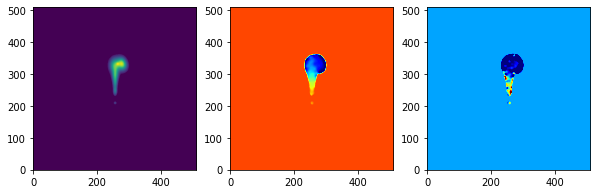

(Truth - Output)


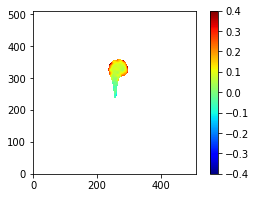

Chi-Square : 0.175	
Image Fidelity : 0.909	

----------------------------------------------------------------------
Convergence Plots : Peak Residual and Model Flux
----------------------------------------------------------------------
Total Runtime : 41.28


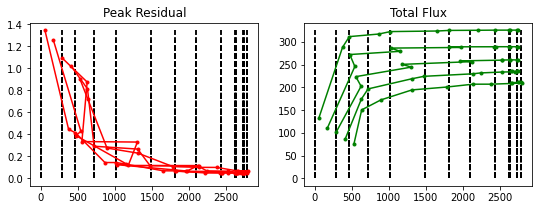

In [98]:
%run -i Sim_Multiscale_Wideband_Script.py
%run -i Display_Experiments_Script.py
all_results['try_cube_multiscale'] =inspectResults(imagename='try_cube_multiscale',truthname='sim_'+source,maskthreshold=0.5)

## ASP Cube (round mask)

In [99]:
if run_imaging==True:
    imname='try_cube_asp'
    os.system('rm -rf '+imname+'.*')
    casalog.setlogfile(imname+'.log')
    
    st = time.time()
    rec = tclean(vis='sim_data_VLA.ms',imagename=imname,imsize=512,cell='12.0arcsec',
           specmode='cube',interpolation='nearest',nchan=5,start='1.0GHz',width='0.2GHz',
           pblimit=-1e-05,deconvolver='asp',niter=20000,gain=0.8, threshold='0.05Jy',nsigma=1.5,fusedthreshold=0.05,
           largestscale=10, interactive=0,mask='circle[[256pix,290pix],140pix]')
    et = time.time()
    rec['runtime']=et-st
    np.save(imname+'.summary.npy', rec) 


-----------------------------------------------------------------------
Restored and Residual Images and RMS
-----------------------------------------------------------------------
Channels from try_cube_asp.image


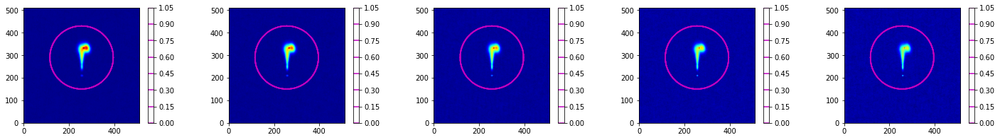

Channels from try_cube_asp.residual


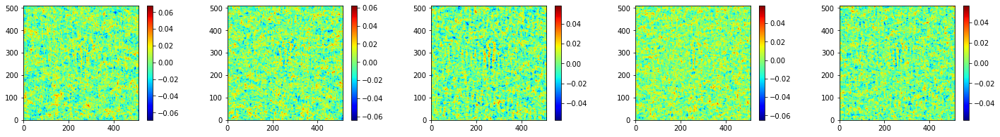

RMS spectrum : [0.01545593 0.01421924 0.01382215 0.01387046 0.01412664]

-----------------------------------------------------------------------
Chisq and Image Fidelity
-----------------------------------------------------------------------
(Truth - Output)/max(Truth_0)


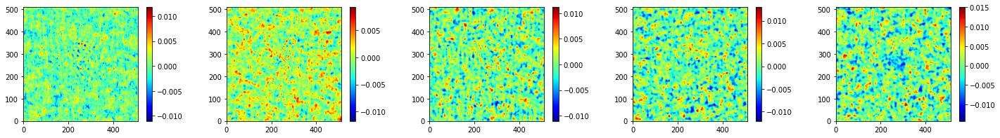

Chi-Square : 0.015	0.016	0.019	0.022	0.026	
Image Fidelity : 0.983	0.984	0.983	0.978	0.974	

----------------------------------------------------------------------
Fitted continuum intensity, spectral index and curvature
----------------------------------------------------------------------


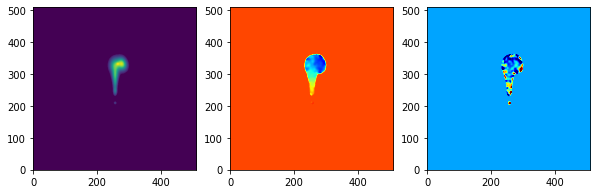

(Truth - Output)


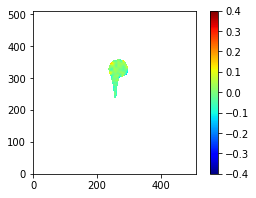

Chi-Square : 0.061	
Image Fidelity : 0.973	

----------------------------------------------------------------------
Convergence Plots : Peak Residual and Model Flux
----------------------------------------------------------------------
Total Runtime : 274.89


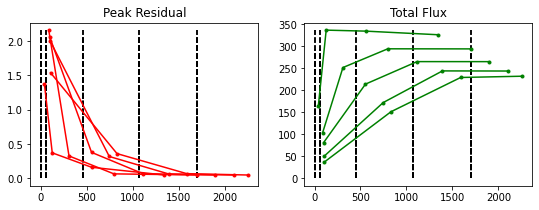

In [100]:
all_results['try_cube_asp'] =inspectResults(imagename='try_cube_asp',truthname='sim_'+source,maskthreshold=0.5)

## Hogbom with automasking
This test is to provide a comparison with the current usage mode of the ALMA pipeline. 

In [105]:
if run_imaging==True:
    imname='try_cube_hogbom_automask'
    os.system('rm -rf '+imname+'.*')
    casalog.setlogfile(imname+'.log')

    st = time.time()
    rec = tclean(vis='sim_data_VLA.ms',imagename=imname,imsize=512,cell='12.0arcsec',
           specmode='cube',interpolation='nearest',nchan=5,start='1.0GHz',width='0.2GHz',
           pblimit=-1e-05,deconvolver='hogbom',niter=100000, gain=0.2, threshold='0.05Jy',nsigma=1.5,
           interactive=0,usemask='auto-multithresh',noisethreshold=4.0,sidelobethreshold=1.0,pbmask=0.01)
    et = time.time()
    rec['runtime']=et-st
    np.save(imname+'.summary.npy', rec) 


-----------------------------------------------------------------------
Restored and Residual Images and RMS
-----------------------------------------------------------------------
Channels from try_cube_hogbom_automask.image


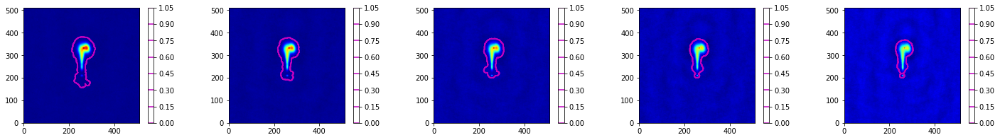

Channels from try_cube_hogbom_automask.residual


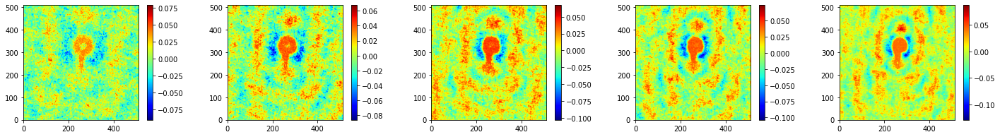

RMS spectrum : [0.01918649 0.01950071 0.02006197 0.02081728 0.02182744]

-----------------------------------------------------------------------
Chisq and Image Fidelity
-----------------------------------------------------------------------
(Truth - Output)/max(Truth_0)


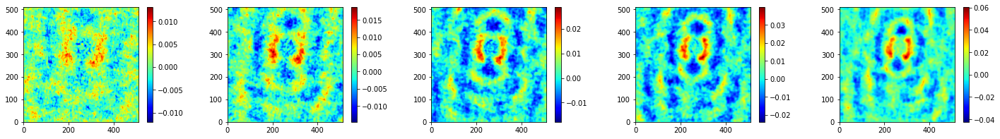

Chi-Square : 0.019	0.029	0.040	0.056	0.076	
Image Fidelity : 0.980	0.972	0.964	0.947	0.911	

----------------------------------------------------------------------
Fitted continuum intensity, spectral index and curvature
----------------------------------------------------------------------


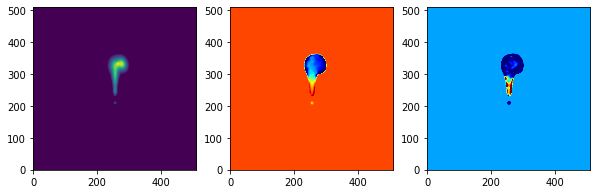

(Truth - Output)


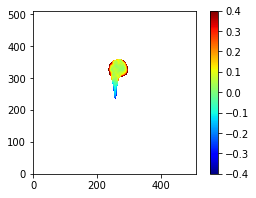

Chi-Square : 0.335	
Image Fidelity : 0.894	

----------------------------------------------------------------------
Convergence Plots : Peak Residual and Model Flux
----------------------------------------------------------------------
Total Runtime : 53.93


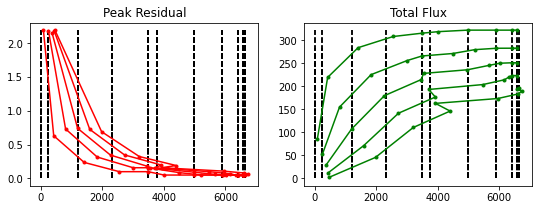

In [106]:
%run -i Sim_Multiscale_Wideband_Script.py
%run -i Display_Experiments_Script.py

all_results['try_cube_hogbom_automask'] = inspectResults(imagename='try_cube_hogbom_automask',truthname='sim_'+source,maskthreshold=0.5)


## Comparison of Results (with mask) <a class="anchor" id="CompareResults1"></a>

In [107]:
print(all_results.keys())

dict_keys(['try_cube_hogbom', 'try_cube_multiscale', 'try_cube_asp', 'try_cube_hogbom_automask'])


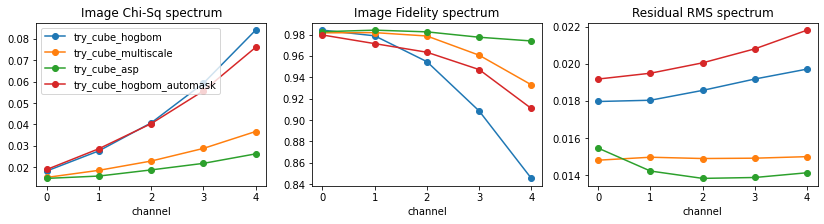

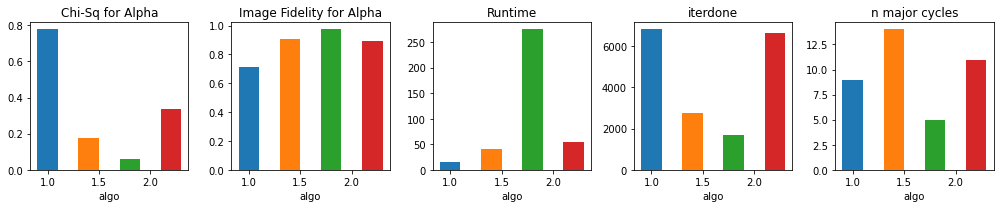

In [108]:
%run -i Sim_Multiscale_Wideband_Script.py
%run -i Display_Experiments_Script.py

compareResults(all_results)

These results show a clear improvement in numerical accuracy from Hogbom to MultiScale to Asp. This is true for the flux density as well as the fitted spectral index (alpha).  The faster convergence of the Asp algorithm is also seen from the reduction in the number of minor cycle iterations and major cycles needed to reach the desired nsigma convergence criterion.  This shows that the numerical behaviour for a working run, is exactly as expected.

The runtime of Asp is significantly higher than Hogbom and Multiscale. This too is expected since each iteration itself involves a fitting process to obtain best-fit Gaussian parameters. The relative runtime difference with Hogbom and Multiscale is only an illustration, derived from this one dataset. 



# Compare Hogbom, Multiscale, Asp (no masks) <a class="anchor" id="CompareNoMasks"></a>

## Hogbom Cube (no mask)

In [75]:
%run -i Sim_Multiscale_Wideband_Script.py
%run -i Display_Experiments_Script.py

nomask_results={}

In [76]:
if run_imaging==True:
    imname = 'try_cube_hogbom_nomask'
    os.system('rm -rf '+imname+'.*')
    casalog.setlogfile(imname+'.log')
    st = time.time()

    ## 50k iterations to do the best it can
    rec = tclean(vis='sim_data_VLA.ms',imagename=imname,imsize=512,cell='12.0arcsec',
           specmode='cube',interpolation='nearest',nchan=5,start='1.0GHz',width='0.2GHz',
           pblimit=-1e-05,deconvolver='hogbom',niter=100000, gain=0.2, threshold='0.05Jy',nsigma=1.5,
            interactive=0)
    et = time.time()
    rec['runtime']=et-st
    np.save(imname+'.summary.npy', rec) 


-----------------------------------------------------------------------
Restored and Residual Images and RMS
-----------------------------------------------------------------------
Channels from try_cube_hogbom_nomask.image


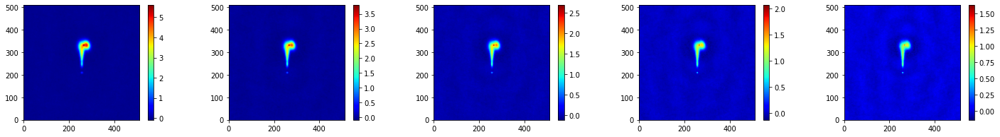

Channels from try_cube_hogbom_nomask.residual


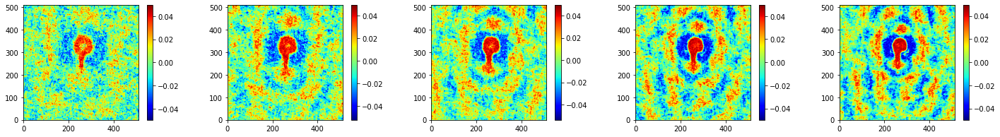

RMS spectrum : [0.01655864 0.0173112  0.01762303 0.01845035 0.01885496]

-----------------------------------------------------------------------
Chisq and Image Fidelity
-----------------------------------------------------------------------
(Truth - Output)/max(Truth_0)


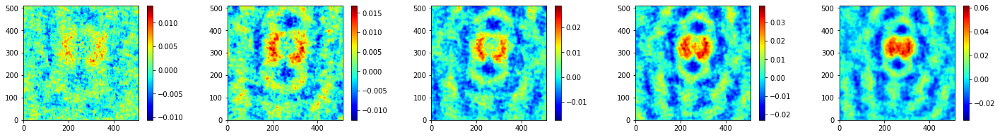

Chi-Square : 0.017	0.027	0.040	0.058	0.083	
Image Fidelity : 0.985	0.979	0.952	0.906	0.843	

----------------------------------------------------------------------
Fitted continuum intensity, spectral index and curvature
----------------------------------------------------------------------


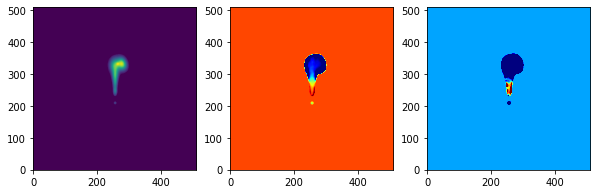

(Truth - Output)


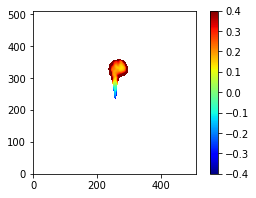

Chi-Square : 0.802	
Image Fidelity : 0.704	

----------------------------------------------------------------------
Convergence Plots : Peak Residual and Model Flux
----------------------------------------------------------------------
Total Runtime : 16.38


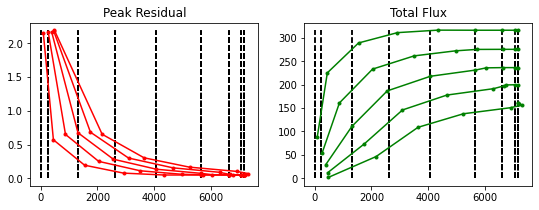

In [77]:
%run -i Sim_Multiscale_Wideband_Script.py
%run -i Display_Experiments_Script.py

nomask_results['try_cube_hogbom_nomask'] = inspectResults(imagename='try_cube_hogbom_nomask',truthname='sim_'+source,maskthreshold=0.5)

## Multiscale Cube (no mask)

In [78]:
if run_imaging==True:
    imname = 'try_cube_multiscale_nomask'
    os.system('rm -rf '+imname+'.*')
    casalog.setlogfile(imname+'.log')

    st = time.time()
    rec = tclean(vis='sim_data_VLA.ms',imagename=imname,imsize=512,cell='12.0arcsec',
           specmode='cube',interpolation='nearest',nchan=5,start='1.0GHz',width='0.2GHz',
           pblimit=-1e-05,deconvolver='multiscale',niter=20000,gain=0.2,  threshold='0.05Jy',nsigma=1.5,
                 scales=[0,3,10],interactive=0)  ## Need to leave out the larger scale of 20 to avoid divergence.
    et = time.time()
    rec['runtime']=et-st
    np.save(imname+'.summary.npy', rec) 


-----------------------------------------------------------------------
Restored and Residual Images and RMS
-----------------------------------------------------------------------
Channels from try_cube_multiscale_nomask.image


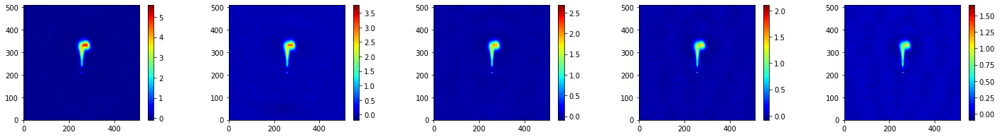

Channels from try_cube_multiscale_nomask.residual


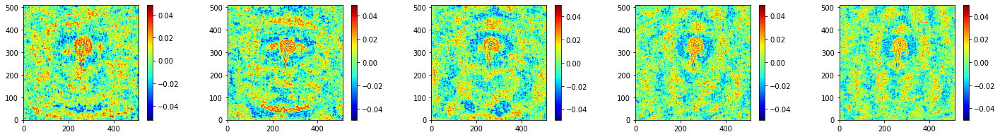

RMS spectrum : [0.01522643 0.015528   0.01539105 0.01501351 0.01498438]

-----------------------------------------------------------------------
Chisq and Image Fidelity
-----------------------------------------------------------------------
(Truth - Output)/max(Truth_0)


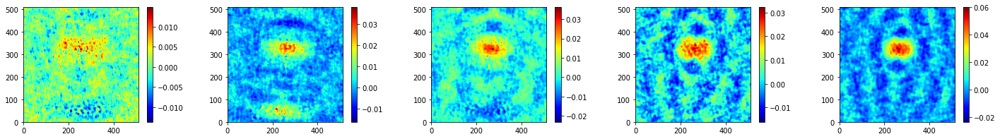

Chi-Square : 0.019	0.038	0.038	0.041	0.060	
Image Fidelity : 0.968	0.897	0.900	0.904	0.841	

----------------------------------------------------------------------
Fitted continuum intensity, spectral index and curvature
----------------------------------------------------------------------


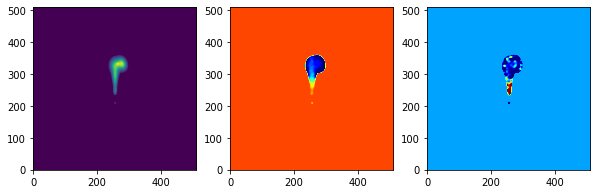

(Truth - Output)


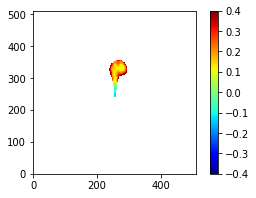

Chi-Square : 0.320	
Image Fidelity : 0.813	

----------------------------------------------------------------------
Convergence Plots : Peak Residual and Model Flux
----------------------------------------------------------------------
Total Runtime : 63.53


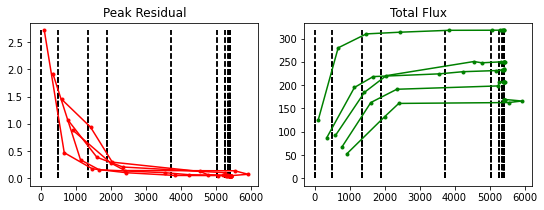

In [79]:
%run -i Sim_Multiscale_Wideband_Script.py
%run -i Display_Experiments_Script.py
nomask_results['try_cube_multiscale_nomask'] =inspectResults(imagename='try_cube_multiscale_nomask',truthname='sim_'+source,maskthreshold=0.8)

## ASP Cube (no mask)

In [80]:
if run_imaging==True:
    imname = 'try_cube_asp_nomask'
    os.system('rm -rf '+imname+'.*')
    casalog.setlogfile(imname+'.log')

    st = time.time()
    rec = tclean(vis='sim_data_VLA.ms',imagename=imname,imsize=512,cell='12.0arcsec',
           specmode='cube',interpolation='nearest',nchan=5,start='1.0GHz',width='0.2GHz',
           pblimit=-1e-05,deconvolver='asp',niter=20000,gain=0.2, threshold='0.05Jy',
           nsigma=1.5,fusedthreshold=0.05,
           largestscale=10, interactive=0)
    et = time.time()
    rec['runtime']=et-st
    np.save(imname+'.summary.npy', rec) 

## Asp displayed less tolerance of a high loop gain, without masks. 
## gain=0.8 and cyclefactor=0.7 produced errors in the model image.
## gain=0.4 and cyclefactor was more stable. 


-----------------------------------------------------------------------
Restored and Residual Images and RMS
-----------------------------------------------------------------------
Channels from try_cube_asp_nomask.image


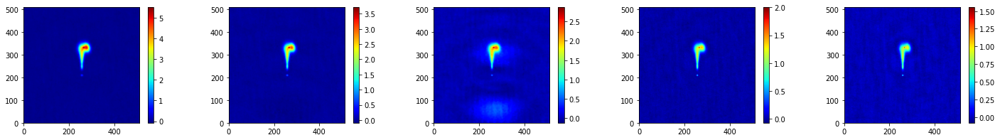

Channels from try_cube_asp_nomask.residual


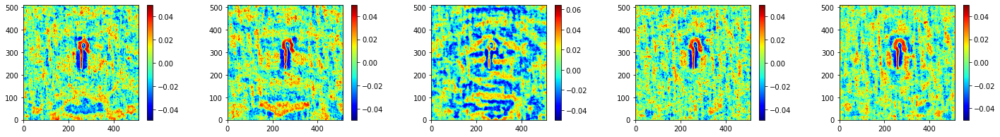

RMS spectrum : [0.01581405 0.01660316 0.02033592 0.01592279 0.01584646]

-----------------------------------------------------------------------
Chisq and Image Fidelity
-----------------------------------------------------------------------
(Truth - Output)/max(Truth_0)


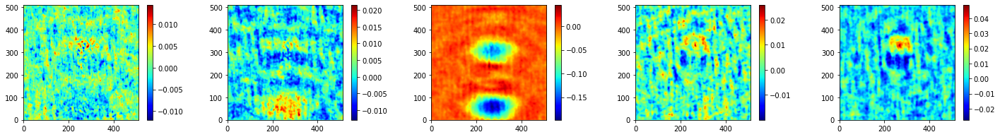

Chi-Square : 0.019	0.029	0.253	0.035	0.052	
Image Fidelity : 0.973	0.965	0.457	0.956	0.898	

----------------------------------------------------------------------
Fitted continuum intensity, spectral index and curvature
----------------------------------------------------------------------


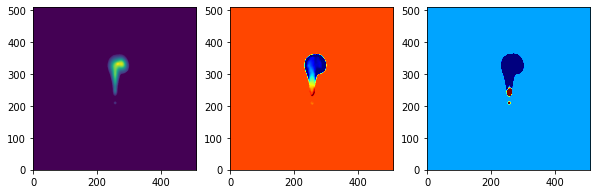

(Truth - Output)


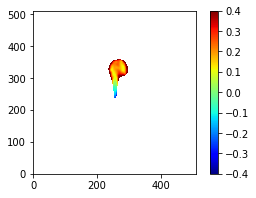

Chi-Square : 0.359	
Image Fidelity : 0.782	

----------------------------------------------------------------------
Convergence Plots : Peak Residual and Model Flux
----------------------------------------------------------------------
Total Runtime : 612.57


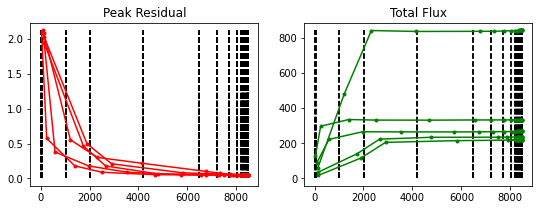

In [81]:
%run -i Sim_Multiscale_Wideband_Script.py
%run -i Display_Experiments_Script.py

nomask_results['try_cube_asp_nomask'] =inspectResults(imagename='try_cube_asp_nomask',truthname='sim_'+source,maskthreshold=0.5)

## Comparison of Results (no mask) <a class="anchor" id="CompareResults2"></a>

In [82]:
print(all_results.keys())

dict_keys(['try_cube_hogbom', 'try_cube_hogbom_automask', 'try_cube_multiscale', 'try_cube_asp'])


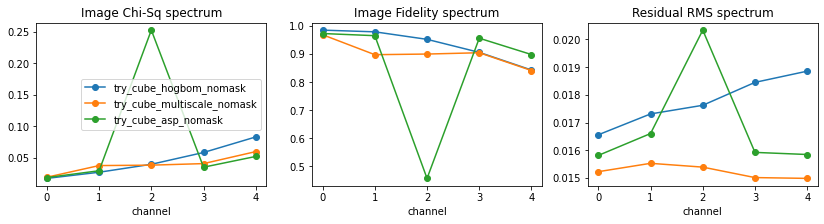

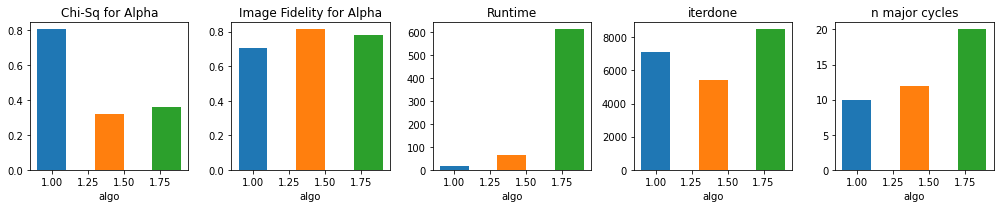

In [83]:
%run -i Sim_Multiscale_Wideband_Script.py
%run -i Display_Experiments_Script.py

compareResults(nomask_results)

These results show that all three algorithms have a noticeable reduction in accuracy, without the stabilizing round mask. However, for one channel, the Asp algorithm had instabilities it could not recover from.

Initially, the Asp algorithm was tried with a loop gain of 0.8 but that run produced several spurious mid-to-large scale components in the model image in areas away from the source.  Reducing the loop gain from 0.8 to 0.4 and then 0.2 (to match the setting for the other two algorithms) helped considerably but still did not generate adequate results for at least one channel.  This suggests that (for this one example that is prone to instability) a simple region-based mask around the source was necessary for Asp. 

Note : So far, this behaviour of Asp has been specific to this dataset.

# Tuning the ASP deconvolver <a class="anchor" id="TuningAsp"></a>
Below is a comparison of the default behaviour of the implemented algorithm as well as the effect of using its two tuning parameters.

-  largestscale : By default, the implementation picks an initial guess of scale sizes that later evolve. largestscale limits the largest scale allowed for this initial guess. It should be picked as the largest scale for which appropriate data constraints may exist. It may be set, based of the uv-coverage of the observation (and not the actual sky structure as is required by the scale parameter in the msclean algorithm). 

-  fusedthreshold : A threshold (on residual image pixel amplitude) below which the algorithm will use only point-source flux components. This is to reduce compute cost as well as to use delta functions when the residual pattern is no longer easily modeled by Gaussians. 

In [84]:
tune_results={}

## Asp Defaults

In [85]:
if run_imaging==True:
    imname = 'try_cube_asp_default'
    os.system('rm -rf '+imname+'.*')
    casalog.setlogfile(imname+'.log')
    
    st = time.time()
    rec = tclean(vis='sim_data_VLA.ms',imagename=imname,imsize=512,cell='12.0arcsec',
           specmode='cube',interpolation='nearest',nchan=5,start='1.0GHz',width='0.2GHz',
           pblimit=-1e-05,deconvolver='asp',niter=20000,gain=0.2,threshold='0.05Jy',nsigma=1.5,
                     interactive=0,mask='circle[[256pix,290pix],140pix]')
    et = time.time()
    rec['runtime']=et-st
    np.save(imname+'.summary.npy', rec) 



-----------------------------------------------------------------------
Restored and Residual Images and RMS
-----------------------------------------------------------------------
Channels from try_cube_asp_default.image


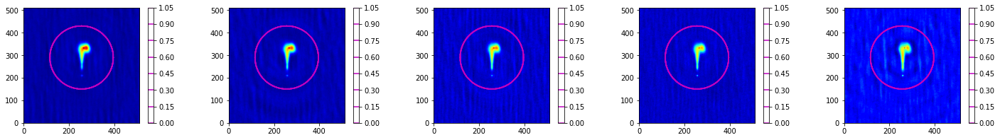

Channels from try_cube_asp_default.residual


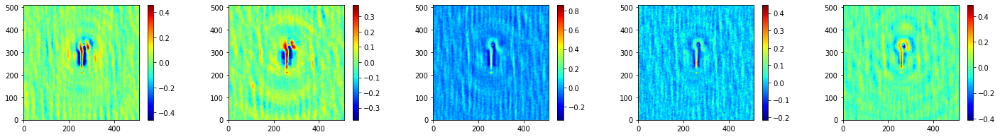

RMS spectrum : [0.0652628  0.05723036 0.04998393 0.02953747 0.05058482]

-----------------------------------------------------------------------
Chisq and Image Fidelity
-----------------------------------------------------------------------
(Truth - Output)/max(Truth_0)


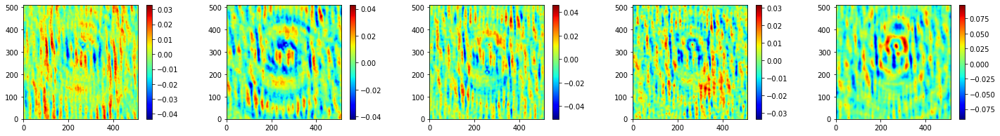

Chi-Square : 0.063	0.078	0.084	0.059	0.154	
Image Fidelity : 0.926	0.898	0.909	0.925	0.796	

----------------------------------------------------------------------
Fitted continuum intensity, spectral index and curvature
----------------------------------------------------------------------


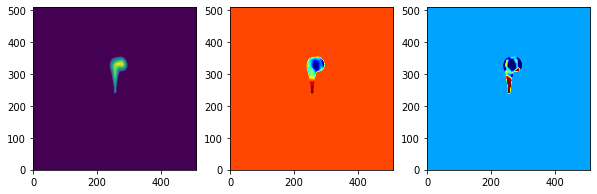

(Truth - Output)


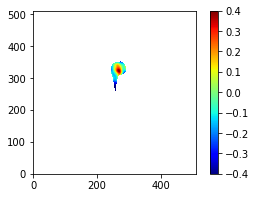

Chi-Square : 0.230	
Image Fidelity : 0.826	

----------------------------------------------------------------------
Convergence Plots : Peak Residual and Model Flux
----------------------------------------------------------------------
Total Runtime : 3984.98


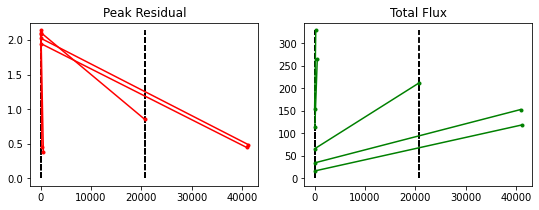

In [86]:
tune_results['try_cube_asp_default'] =inspectResults(imagename='try_cube_asp_default',truthname='sim_'+source,maskthreshold=1.5)

## Asp : largestscale only

In [87]:
## With largest scale set

if run_imaging==True:
    imname = 'try_cube_asp_ls'
    os.system('rm -rf '+imname+'.*')
    casalog.setlogfile(imname+'.log')

    st = time.time()
    rec = tclean(vis='sim_data_VLA.ms',imagename=imname,imsize=512,cell='12.0arcsec',
           specmode='cube',interpolation='nearest',nchan=5,start='1.0GHz',width='0.2GHz',
           pblimit=-1e-05,deconvolver='asp',niter=20000,gain=0.2,threshold='0.05Jy',nsigma=1.5,largestscale=10,
                     interactive=0,mask='circle[[256pix,290pix],140pix]')
    et = time.time()
    rec['runtime']=et-st
    np.save(imname+'.summary.npy', rec) 


-----------------------------------------------------------------------
Restored and Residual Images and RMS
-----------------------------------------------------------------------
Channels from try_cube_asp_ls.image


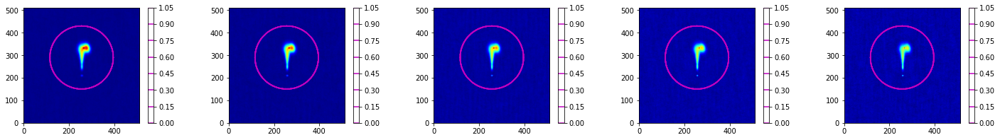

Channels from try_cube_asp_ls.residual


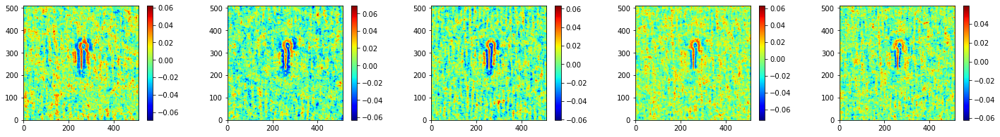

RMS spectrum : [0.01666741 0.01630911 0.01601129 0.01565526 0.01544843]

-----------------------------------------------------------------------
Chisq and Image Fidelity
-----------------------------------------------------------------------
(Truth - Output)/max(Truth_0)


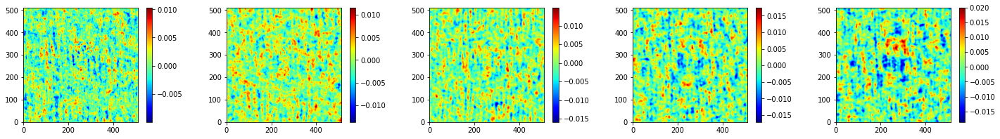

Chi-Square : 0.017	0.020	0.024	0.030	0.036	
Image Fidelity : 0.981	0.981	0.975	0.970	0.952	

----------------------------------------------------------------------
Fitted continuum intensity, spectral index and curvature
----------------------------------------------------------------------


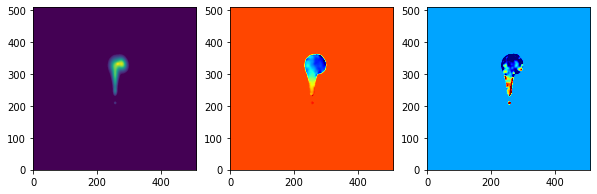

(Truth - Output)


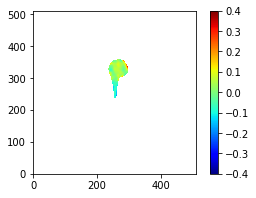

Chi-Square : 0.102	
Image Fidelity : 0.948	

----------------------------------------------------------------------
Convergence Plots : Peak Residual and Model Flux
----------------------------------------------------------------------
Total Runtime : 523.26


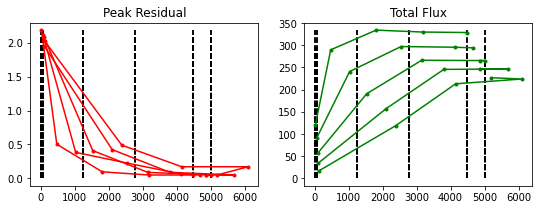

In [88]:
tune_results['try_cube_asp_ls'] =inspectResults(imagename='try_cube_asp_ls',truthname='sim_'+source,maskthreshold=0.5)

## Asp - largestscale and high loop gain

In [89]:
### With largest scale and a high loop gain
if run_imaging==True:
    ### Now try with largestscale set, and a high loop gain.....
    imname = 'try_cube_asp_gain'
    os.system('rm -rf '+imname+'.*')
    casalog.setlogfile(imname+'.log')

    st = time.time()
    rec = tclean(vis='sim_data_VLA.ms',imagename=imname,imsize=512,cell='12.0arcsec',
           specmode='cube',interpolation='nearest',nchan=5,start='1.0GHz',width='0.2GHz',
           pblimit=-1e-05,deconvolver='asp',niter=20000,gain=0.8,threshold='0.05Jy',nsigma=1.5,largestscale=10,
                     interactive=0,mask='circle[[256pix,290pix],140pix]')
    et = time.time()
    rec['runtime']=et-st
    np.save(imname+'.summary.npy', rec) 


-----------------------------------------------------------------------
Restored and Residual Images and RMS
-----------------------------------------------------------------------
Channels from try_cube_asp_gain.image


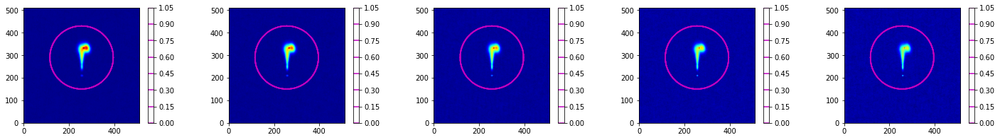

Channels from try_cube_asp_gain.residual


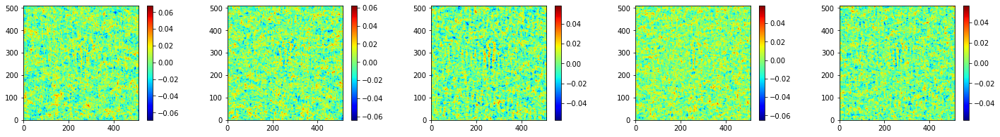

RMS spectrum : [0.01545593 0.01421924 0.01382215 0.01387046 0.01412664]

-----------------------------------------------------------------------
Chisq and Image Fidelity
-----------------------------------------------------------------------
(Truth - Output)/max(Truth_0)


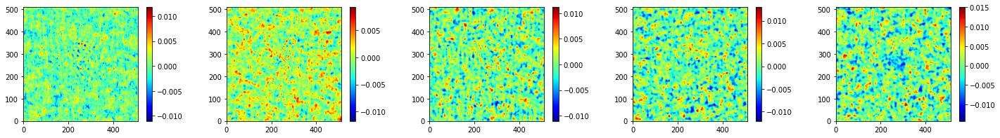

Chi-Square : 0.015	0.016	0.019	0.022	0.026	
Image Fidelity : 0.983	0.984	0.983	0.978	0.974	

----------------------------------------------------------------------
Fitted continuum intensity, spectral index and curvature
----------------------------------------------------------------------


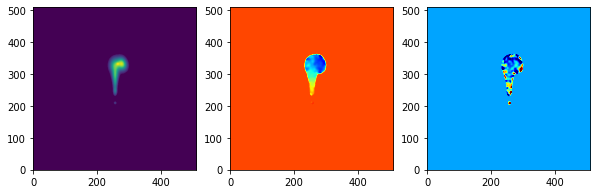

(Truth - Output)


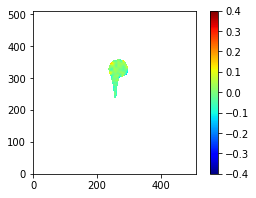

Chi-Square : 0.061	
Image Fidelity : 0.973	

----------------------------------------------------------------------
Convergence Plots : Peak Residual and Model Flux
----------------------------------------------------------------------
Total Runtime : 225.48


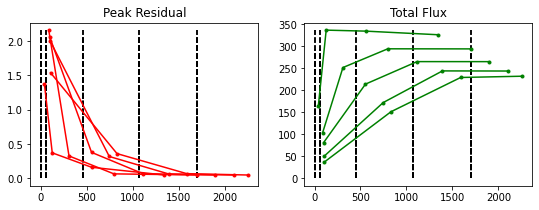

In [90]:
tune_results['try_cube_asp_gain'] =inspectResults(imagename='try_cube_asp_gain',truthname='sim_'+source,maskthreshold=0.5)

## Asp - largest scale, high loop gain, fusedthreshold

In [91]:
### With largest scale and a high loop gain and fusedthreshold set to something higher than the noise level...
if run_imaging==True:
    imname = 'try_cube_asp_ft'
    os.system('rm -rf '+imname+'.*')
    casalog.setlogfile(imname+'.log')
    
    st = time.time()
    rec = tclean(vis='sim_data_VLA.ms',imagename=imname,imsize=512,cell='12.0arcsec',
           specmode='cube',interpolation='nearest',nchan=5,start='1.0GHz',width='0.2GHz',
           pblimit=-1e-05,deconvolver='asp',niter=20000,gain=0.8,threshold='0.05Jy',nsigma=1.5,largestscale=10,
           fusedthreshold = 0.2, interactive=0,mask='circle[[256pix,290pix],140pix]')
    et = time.time()
    rec['runtime']=et-st
    np.save(imname+'.summary.npy', rec) 


-----------------------------------------------------------------------
Restored and Residual Images and RMS
-----------------------------------------------------------------------
Channels from try_cube_asp_ft.image


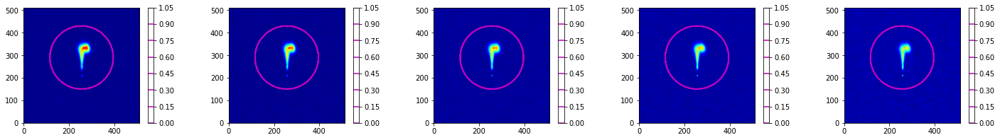

Channels from try_cube_asp_ft.residual


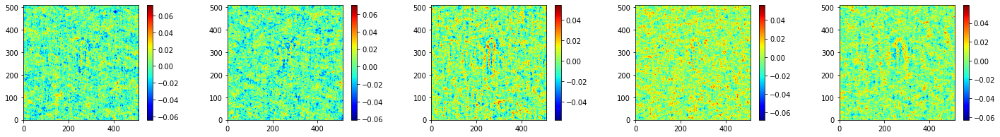

RMS spectrum : [0.01541532 0.01454054 0.01408977 0.01418174 0.0144513 ]

-----------------------------------------------------------------------
Chisq and Image Fidelity
-----------------------------------------------------------------------
(Truth - Output)/max(Truth_0)


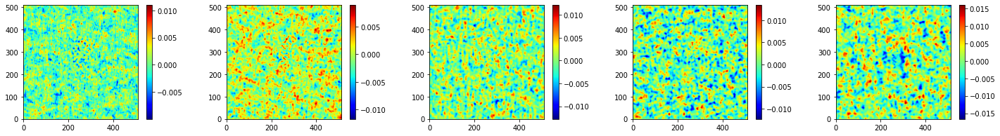

Chi-Square : 0.015	0.017	0.020	0.023	0.030	
Image Fidelity : 0.984	0.983	0.983	0.976	0.966	

----------------------------------------------------------------------
Fitted continuum intensity, spectral index and curvature
----------------------------------------------------------------------


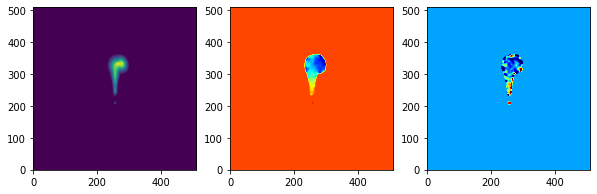

(Truth - Output)


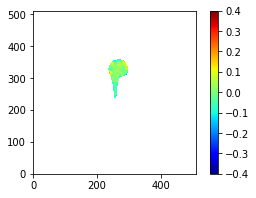

Chi-Square : 0.072	
Image Fidelity : 0.966	

----------------------------------------------------------------------
Convergence Plots : Peak Residual and Model Flux
----------------------------------------------------------------------
Total Runtime : 172.36


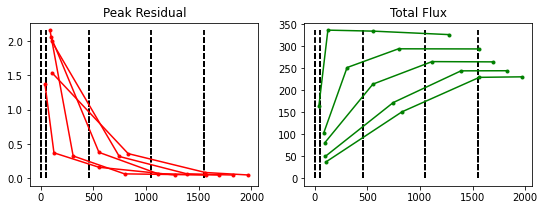

In [92]:
tune_results['try_cube_asp_ft'] =inspectResults(imagename='try_cube_asp_ft',truthname='sim_'+source,maskthreshold=0.5)

## Comparison of different tunings <a class="anchor" id="CompareResults3"></a>

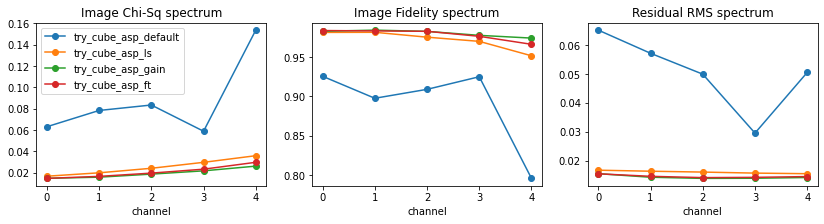

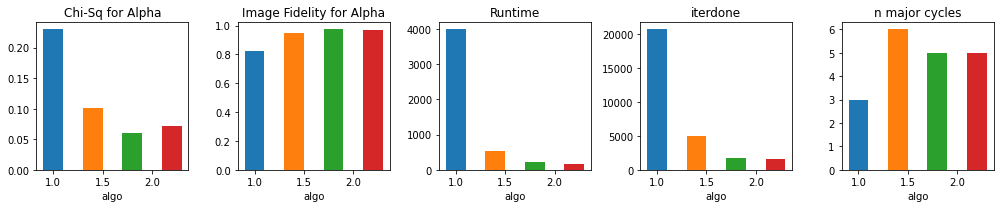

In [93]:

%run -i Sim_Multiscale_Wideband_Script.py
%run -i Display_Experiments_Script.py

compareResults(tune_results)

__Blue__ : With the defaults, for this dataset, Asp performs a very large number of iterations without much benefit (i.e. it did not reach minor cycle stopping thresholds as soon as the later tuned runs). The initial guess of scale sizes includes two sizes larger than 10pix, and could have contributed to unconstrained iterations. (Note : For this dataset, the Multiscale algorithm also exhibits a similar instability when provided with scale sizes beyond 10pix. Tests on other simulated and real datasets (not reported here) did not show such instabilities.) 

__Orange__ : With a limit on the largest scale, the convergence stabilized very well, converging faster and with better accuracy. This demonstrates the efficacy of this control parameter and that it is behaving as intended.

__Green__ : The addition of a high loop gain (from the default of 0.1 to 0.8) showed faster convergence and also numerical improvement. This demonstrates the expected behaviour for an algorithm with more accuracy per minor cycle iteration. 

__Red__ : Switching to point source deconvolution partway through the deconvolution improved runtime (by 20% for this example and setup) but degraded the numerical performance only very slightly (in comparison to the other Asp runs). This demonstrates the expected behaviour of improved speed at the cost of some accuracy, of switching to a Hogbom-like algorithm below a certain threshold. 

## Future Work <a class="anchor" id="Future"></a>

### Code Changes for current features : 
 -  largestscale is an 'int'. Should probably be 'float' to match the msclean 'scales' parameter.
 -  fusedthreshold should allow specification in units of Jy (like 'threshold')
 
### Features :
 - Addition of the Wideband-Asp algorithm (replacing the multiscale part of MTMFS with Asp). 

### Documentation :
 - Add information about the ability to use a high loop gain with Asp, because of the highly accurate flux component models per iteration (it is not a greedy approach like Hogbom or MSClean). 

### Tests :
 - Test the use of the "scale binning" information in the logger. Currently, binned information is not cumulative across major cycle boundaries, and the bins adapt to the range of scales used with each deconvolver call.  The current information, however, is already very useful for recording the range of scale sizes that Asp picked.
 - Test whether all Asp runs can always start with a scales initial guess of just a single scale the same size as the point spread function (or a delta-fn) and whether it is able to adapt from there.  This could simplify the setting of the default value of 'largestscale'. 

 